# Inversion example of diffusion + tracer mineral (uranium salt) dissolution inversion in 2d

- Importation of the required modules

In [1]:
import copy
import logging
import os
from pathlib import Path
from typing import Generator, Iterable, List, Sequence, Tuple, Union

import matplotlib as mpl
import matplotlib.pyplot as plt
import nested_grid_plotter as ngp
import numpy as np
import pyrtid
import pyrtid.forward as dmfwd
import pyrtid.inverse as dminv
import pyrtid.utils.spde as spde
import tomli
from IPython.display import HTML
from matplotlib.animation import HTMLWriter
from matplotlib.collections import PatchCollection
from matplotlib.colors import SymLogNorm
from matplotlib.patches import Polygon
from pyrtid.inverse.params import (
    get_gridded_archived_gradients,
    get_param_values,
)
from pyrtid.utils import (
    StrEnum,
    indices_to_node_number,
    node_number_to_indices,
)
from pyrtid.utils.types import NDArrayFloat, NDArrayInt
from pyrtid.utils.wellfield import gen_wells_coordinates
from scipy.interpolate import interp1d
from shapely.geometry import Polygon as ShapelyPolygon
from shapely.geometry import box as ShapelyBox
from shapely.ops import cascaded_union
from sksparse.cholmod import cholesky

- Set-up logging level

In [2]:
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.info("this is a logging test")
print("This is a print test")

INFO:root:this is a logging test


This is a print test


- Check package/software versions

In [3]:
pyrtid.utils.show_versions()

INFO:root:Current version = 0.1.2

INFO:root:Used packages version:

INFO:root:iterative_ensemble_smoother = 0.1.1
INFO:root:gstools                     = 1.5.1
INFO:root:matplotlib                  = 3.7.2
INFO:root:nested_grid_plotter         = 1.0.1
INFO:root:numdiftools                 = 0.9.41
INFO:root:numpy                       = 1.25.2
INFO:root:pyesmda                     = 0.4.3
INFO:root:pypcga                      = 0.1.0
INFO:root:scipy                       = 1.10.1
INFO:root:sksparse                    = 0.4.12
INFO:root:stochopy                    = 2.3.0


- Random number generator with a given seed for reproducible results

In [4]:
rng = np.random.default_rng(2023)

- Create a directory to store the exported figures

In [5]:
ipynb_path = os.path.dirname(os.path.realpath("__file__"))
fig_save_path = Path(ipynb_path, "exported_figures")
fig_save_path.mkdir(parents=True, exist_ok=True)  # make sure that the directory exists

- Define some configurations for the plots

In [6]:
# Some configs for the plots
new_rc_params = {
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "DejaVu Sans"],
    "font.size": 16,
    "text.usetex": False,
    "savefig.format": "svg",
    "svg.fonttype": "none",  # to store text as text, not as path
    "savefig.facecolor": "w",
    "savefig.edgecolor": "k",
    "savefig.dpi": 300,
    "figure.constrained_layout.use": True,
    "figure.facecolor": "w",
    # "axes.facecolor": "w",
}
csfont = {"fontname": "Comic Sans MS"}
hfont = {"fontname": "Helvetica"}
plt.plot()
plt.close()  # required for the plot to update
plt.rcParams.update(new_rc_params)

- Define a flag to turn off/on the complete notebook run

In [7]:
class Lg(StrEnum):
    FRENCH = "french"
    ENGLISH = "english"


with open("config.toml", "rb") as f:
    data = tomli.load(f)

    is_run_all = data["is_run_all"]
    # whether to run asm inversion
    is_run_asm = data["is_run_asm"] or is_run_all
    # whether to run pcga inversion
    is_run_pcga = data["is_run_pcga"] or is_run_all
    # whether to run esmda inversion
    is_run_esmda = data["is_run_esmda"] or is_run_all
    # whether to run sies inversion
    is_run_sies = data["is_run_sies"] or is_run_all
    # whether to run the code parallel
    is_parallel = data["is_parallel"]
    # number of workers for the parallel execution
    max_workers = data["max_workers"]
    # language for the plot labels
    language = Lg(data["language"])
    # number of principal component for the inversion with PCGA
    n_pc = data["n_pc"]
    # number of fields for the ensemble smoothers
    n_fields_es = data["n_fields_es"]

    pcga_n_iterations = data["pcga_n_iterations"]
    # does not apply for esmda if restricted step is ON
    esmda_n_iterations = data["esmda_n_iterations"]
    sies_n_iterations = data["sies_n_iterations"]

    # Automatic determination of iteration numbers and inflation parameter
    is_esmda_restricted_step = data["is_esmda_restricted_step"]

    duration_in_days = data["duration_in_days"]
    duration_in_days_inv = data["duration_in_days_inv"]  # used for inversion

    # Needed when we generate the ensemble
    is_run_ensembles = is_run_esmda or is_run_sies

## Forward problem

- Define a very simple pure diffusion case in 1D.

In [8]:
# Grid
nx = (
    57 + 4 * 2
)  # number of voxels along the x axis + 4 * 2 for the borders (regularization)
ny = 57 + 4 * 2  # number of voxels along the y axis
nz = 1
dx = 5.0  # voxel dimension along the x axis
dy = 5.0  # voxel dimension along the y axis
dz = 5.0

# Timesteps
duration_in_seconds = duration_in_days * 3600 * 24
duration_in_seconds_inv = duration_in_days_inv * 3600 * 24
dt_init = 3600 * 6  # timestep in seconds
dt_min = dt_init / 2
dt_max = dt_init * 2
courant_factor = 10

# Hydro parameters
flow_regime = "transient"
diffusion_coef = 1e-10  # general initial diffusion coefficient [m2/s]
permeability = 1e-4  # general permeability
porosity = 0.23  # general porosity [fraction]
storage_coefficient = 1e-3

# Chemistry parameters
c0 = 1.0e-10  # general initial concentration [molal]
c_inj = 1.0  # molal
stocoef = 100

M0 = 0.001  # mineral grade [mol/kg] -> kg of water
kv = -1e-7  # kinetic rate,       [mol/m2/s]
moleweight = 270.0  # molar weight [g/mol]
surface = 500  # cm2/g
As = moleweight * surface / 1e4  # specific area [m2/mol]
logK = 3.2
Ks = 1.0 / pow(10, logK)  # solubility constant [no unit]

- Creation of a network of injectors and producers in shape of hexagons.

In [9]:
# locations in the grid
# selection = index of cells to select. Cells are sorted by y, and if that's equal by x (increasing order).
cell_radius = 40.0
inj_grid_coordinates, prod_grid_coordinates, polygons = gen_wells_coordinates(
    -5.0,
    85.0,
    175.0,
    235.0,
    radius=cell_radius,
    rotation=-30,
    selection=[0, 1, 2, 4, 5, 6, 7],
)

- Get the indices in the grid

In [10]:
prod_grid_indices = np.array(
    [
        np.array(prod_grid_coordinates).T[0] // dx,
        np.array(prod_grid_coordinates).T[1] // dy,
    ],
    dtype=np.int32,
).T

inj_grid_indices = np.array(
    [
        np.array(inj_grid_coordinates).T[0] // dx,
        np.array(inj_grid_coordinates).T[1] // dy,
    ],
    dtype=np.int32,
).T

In [11]:
plotter_wf = ngp.NestedGridPlotter(fig_params={"figsize": (5, 5)})

for i, j in inj_grid_coordinates:
    plotter_wf.ax_dict["ax1-1"].plot(i, j, "ko")

for i, j in prod_grid_coordinates:
    plotter_wf.ax_dict["ax1-1"].plot(i, j, "ro")

patches = []
for polygon in polygons:
    # Add the polygon to the collection of patches
    xy = np.array(polygon)
    patches.append(Polygon(xy, closed=True, facecolor=None))
    # Plot the number of the polygon
p = PatchCollection(patches, alpha=0.75)
p.set_facecolors("white")
p.set_edgecolors("darkgrey")
p.set_linewidth(0.8)
p.set_linestyle("-")
plotter_wf.ax_dict["ax1-1"].add_collection(p)

for i, prod_coords in enumerate(prod_grid_coordinates):
    plotter_wf.ax_dict["ax1-1"].text(prod_coords[0] - 2, prod_coords[1] + 8, i)

plotter_wf.ax_dict["ax1-1"].set_aspect("equal", adjustable="box")
plotter_wf.ax_dict["ax1-1"].set_xlim(0, nx * dx)
plotter_wf.ax_dict["ax1-1"].set_ylim(0, ny * dy)
plotter_wf.ax_dict["ax1-1"].set_xlabel("X [m]", fontweight="bold")
plotter_wf.ax_dict["ax1-1"].set_ylabel("Y [m]", fontweight="bold")

fname = "7_cells_wellfield"
for format in ["png", "pdf"]:
    plotter_wf.fig.savefig(
        str(fig_save_path.joinpath(f"{fname}.{format}")), format=format
    )
plt.close()

In [12]:
prod_grid_coordinates[0]

(165.85680518387326, 80.0480947161671)

- Make some selection

In [13]:
mpl_polygons = []
shapely_polygons = []

# Iterate the polygons to create matplotlib and shapely polygon instances
for polygon in polygons:
    # Add the polygon to the collection of patches
    xy = np.array(polygon)
    mpl_polygons.append(Polygon(xy, closed=True, facecolor=None))
    shapely_polygons.append(ShapelyPolygon(xy))

# Generate well field polygons
full_box = ShapelyBox(0.0, 0.0, nx * dx, ny * dy)  # polygon covering all the grid
inner_area = cascaded_union(shapely_polygons)  # polygon covering the well-field area
buffered_inner_area = inner_area.buffer(10.0)  # add a 10 m buffer around the
buffered_external_area = full_box.difference(
    buffered_inner_area
)  # ouside well-field area

- Create the flowrates for the wells: 12 m3/h decreasing following an exponential... for the producers with a balanced injection (2 m3/h per associated cell for the injectors).

In [14]:
def gen_flowrates(amplitude: float, coef: float, nt: int, dt: float) -> NDArrayFloat:
    """Generate flowrates with a given amplitude and decrease coefficient.

    Parameters
    ----------
    amplitude : float
        Amplitude in m3/h.
    coef : float
        Decrease coefficient.
    nt : int
        Number of timesteps
    dt : float
        Timesteps.

    Returns
    -------
    np.ndarray
        The flowrates.
    """
    return amplitude * np.exp(coef * np.arange(nt) * dt)

- Generate a flowrates with an initial amplitude at 1 m3/h and plot it
- For now steady state

In [15]:
init_prod_flowrates = 8.0  # m3/s
flowrates = init_prod_flowrates * gen_flowrates(
    1.0, -0.0015, duration_in_days + 1, dt=1.0
)  # m3/h
time_in_days = np.arange(duration_in_days + 1)
# plt.plot(np.arange(nt + 1) * dt / 3600 / 24, flowrates)
# plt.ylim(0.0, init_prod_flowrates * 1.1)

plt.plot(np.arange(duration_in_days + 1), flowrates)
plt.ylim(0.0, init_prod_flowrates * 1.1)
if language == Lg.FRENCH:
    plt.ylabel("flowrates [m3/h]", fontweight="bold")
    plt.xlabel("time [d]", fontweight="bold")
else:
    plt.ylabel("débit [m3/h]", fontweight="bold")
    plt.xlabel("temps [j]", fontweight="bold")

fname = "flowrates_decrease"
for format in ["png", "pdf"]:
    plt.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
plt.close()

- Injected reageant varying over time

In [16]:
conv_h2so4_conc: float = 98.078


def conc_h2so4_molpl_to_gpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x * conv_h2so4_conc)


def conc_h2so4_gpl_to_molpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x / conv_h2so4_conc)


init_prod_flowrates = 8.0  # m3/s
_inj_conc = np.zeros(duration_in_days + 1)
_inj_conc[0:40] = conc_h2so4_gpl_to_molpl(30.0)  # 20 g/l
_inj_conc[40:60] = conc_h2so4_gpl_to_molpl(10.0)  # 10 g/l
_inj_conc[60:100] = conc_h2so4_gpl_to_molpl(6.0)  # 6 g/l
# _inj_conc[70:80] = conc_h2so4_gpl_to_molpl(20.0)  # 6 g/l
# _inj_conc[80:100] = conc_h2so4_gpl_to_molpl(0.0)  # 6 g/l
_inj_conc[100:120] = conc_h2so4_gpl_to_molpl(20.0)  # 20 g/l
_inj_conc[120:160] = conc_h2so4_gpl_to_molpl(5.0)  # 6 g/l
_inj_conc[180:200] = conc_h2so4_gpl_to_molpl(15.0)  # 6 g/l
_inj_conc[200:] = conc_h2so4_gpl_to_molpl(6.0)  # 4 g/l

time_in_days = np.arange(duration_in_days + 1)
# plt.plot(np.arange(nt + 1) * dt / 3600 / 24, flowrates)
plt.ylim(0.0, np.max(conc_h2so4_molpl_to_gpl(_inj_conc)) * 1.1)

plt.plot(np.arange(duration_in_days + 1), conc_h2so4_molpl_to_gpl(_inj_conc))
# plt.ylim(0.0, init_prod_flowrates * 1.1)
if language == Lg.FRENCH:
    plt.ylabel("Injected acid conc [g/l]", fontweight="bold")
    plt.xlabel("time [d]", fontweight="bold")
else:
    plt.ylabel("Concentration en acide [g/l]", fontweight="bold")
    plt.xlabel("temps [j]", fontweight="bold")

fname = "acid_conc"
for format in ["png", "pdf"]:
    plt.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
plt.close()

### Mineral grade: reference vs estimated

The mineral grades are defined in [mol/kg]. We calculate the conversion factor to obtain ppm and perform easier mass balances.

ConvU: parameter for converting the mineral content in [mol/kg] to metal grade in [ppm]. Note that the ConvU parameter is specific to the Uranium carrier phase: here Uraninite.

$C_{Uraninite}[\frac{mol}{kg}] = convU \times T_{Uranium}[ppm]$


and


$conv_u = \frac{1.023 \times density_{rock}}{238*porosity_{rock} \times 1000}$

Note the 1.023 is the conversion factor from molar mass to molal mass in CHESS.

In [17]:
rock_density = 1.63
conv_u_grade: NDArrayFloat = np.array(
    [1.023 * rock_density / (238.0 * porosity * 1000)]
)

- Conversion factor for uranium from mol/l to mg/l

In [18]:
conv_u_conc: float = (270.03 - 0.0016 * 2) * 1e3

- Functions to perform the conversions

In [19]:
def grade_ppm_to_mol_per_kg(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return x * conv_u_grade


def grade_mol_per_kg_to_ppm(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return x / conv_u_grade


def grade_mol_per_kg_to_ppm_1st_derivative(
    x: Union[NDArrayFloat, float],
) -> NDArrayFloat:
    return 1 / conv_u_grade


def conc_molpl_to_mgpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x * conv_u_conc)

In [20]:
conc_h2so4_molpl_to_gpl(2e-1)

array(19.6156)

- Using the SPDE approach, generate a random field

In [21]:
len_scale = 20.0  # m
kappa = 1 / len_scale
alpha = 1.0

mean = 100.0  # trend of the field
std = 150.0  # standard deviation of the field

# Create a precison matrix
Q_ref = spde.get_precision_matrix(
    nx, ny, nz, dx, dy, dz, kappa, alpha, spatial_dim=2, sigma=std
)
cholQ_ref = cholesky(Q_ref)
# Non conditonal simulation -> change the random state to obtain a different field
simu_ = spde.simu_nc(cholQ_ref, random_state=2026).reshape(ny, nx).T
reference_grade_ppm = np.abs(simu_ + mean)

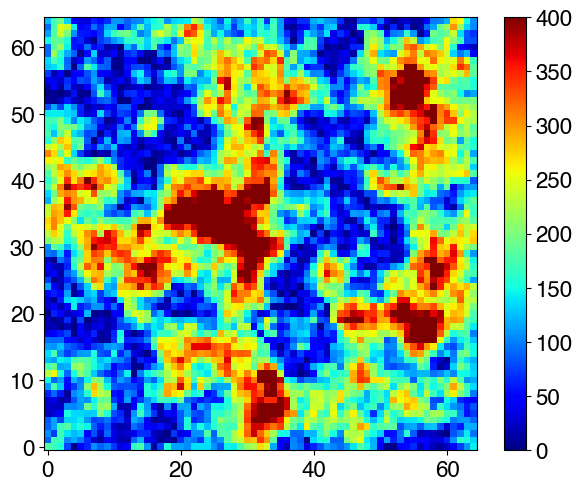

In [22]:
plt.imshow(
    reference_grade_ppm.T,
    origin="lower",
    cmap=plt.get_cmap("jet"),
    aspect="equal",
    vmin=0.0,
    vmax=400,
)
plt.colorbar()

- Simulation du krr

In [23]:
len_scale_krr = 20.0  # m
kappa_krr = 1 / len_scale
alpha_krr = 2.0

mean_krr = 1.3  # trend of the field
std_krr = 0.5  # standard deviation of the field

# Create a precison matrix
Q_krr = spde.get_precision_matrix(
    nx, ny, nz, dx, dy, dz, kappa_krr, alpha_krr, spatial_dim=2, sigma=std_krr
)
cholQ_krr = cholesky(Q_krr)
# Non conditonal simulation -> change the random state to obtain a different field
simu_krr = spde.simu_nc(cholQ_krr, random_state=2026).reshape(ny, nx).T
krr = np.abs(simu_krr + mean_krr)

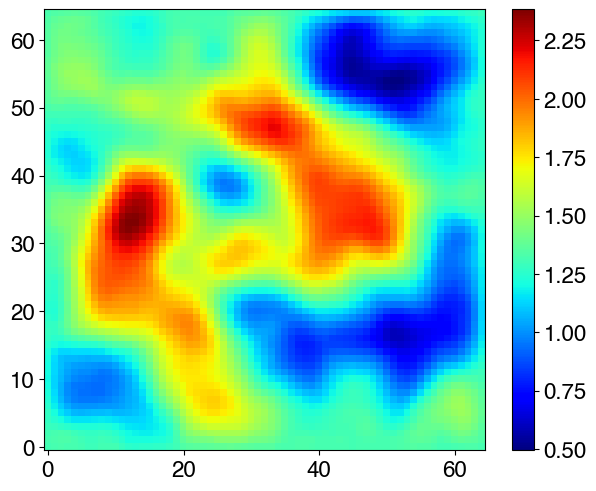

In [24]:
plt.imshow(
    krr.T,
    origin="lower",
    cmap=plt.get_cmap("jet"),
    aspect="equal",
)
plt.colorbar()

- Add extention to avoid boundary issues with the spde approach

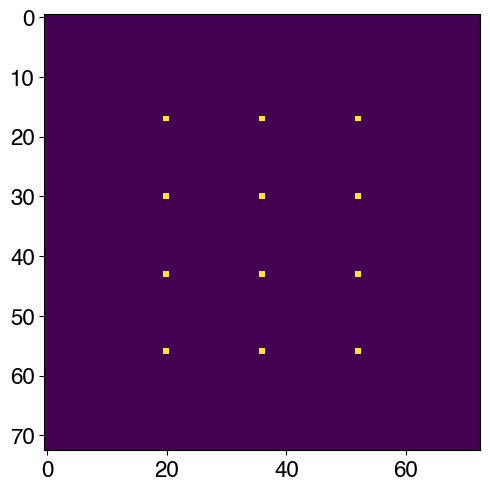

In [25]:
_ix = np.array([int(nx / 4), 2 * int(nx / 4), 3 * int(nx / 4)])
_iy = np.array([int(ny / 5), 2 * int(ny / 5), 3 * int(ny / 5), 4 * int(ny / 5)])
dat_coords = np.array(np.meshgrid(_ix, _iy)).reshape(2, -1)
# Get the node numbers
dat_nn: NDArrayInt = indices_to_node_number(dat_coords[0, :], nx, dat_coords[1, :])
dat_val = reference_grade_ppm.ravel("F")[dat_nn]

nx_ext = 8  # add 8 cells along x
ny_ext = 8  # add 8 cells along y

dat_nn_extended: NDArrayInt = np.array(
    indices_to_node_number(
        dat_coords[0, :] + nx_ext / 2, nx + nx_ext, dat_coords[1, :] + ny_ext / 2
    ),
    dtype=np.int_,
)

a = np.zeros((nx + nx_ext) * (ny + ny_ext))
a[dat_nn_extended] = 1
a2 = a.reshape(nx + nx_ext, ny + ny_ext, order="F")

# plot to check the conditionning well placement
plt.imshow(a2.T, aspect="equal")

- Generate 3 conditional simulations with more or less error on the known data with a varigram which is not exactly correct + one constant field (witness case)

In [26]:
# Generate new points with error -> systematic bias 200 ppm + some variance on the mesures
measure_era = dat_val / krr.ravel("F")[dat_nn]
measure_era_noisy = measure_era * (
    1 + np.random.default_rng(2048).normal(scale=0.1, size=dat_val.size)
)

# ) + 100 * np.random.default_rng(2025).normal(
#     scale=1.0, size=dat_val.size
# )) / 2
estimated_krr = 0.65
dat_val_wrong = measure_era_noisy * estimated_krr

# Condition with the exact data -> we assume a large noise over the data
dat_var_init = np.ones(dat_val.size) * (100**2)

# Compute the average on the data points (trend)
estimated_mean = np.average(dat_val_wrong)
estimated_std = float(np.std(dat_val_wrong))

alpha = 1

# Create a precison matrix
Q_init = spde.get_precision_matrix(
    nx, ny, 1, dx, dy, 1.0, kappa, alpha, spatial_dim=2, sigma=estimated_std
)

# Extended precision matrix to generate the fields
Q_init_extended = spde.get_precision_matrix(
    nx + nx_ext,
    ny + ny_ext,
    1,
    dx,
    dy,
    1.0,
    kappa,
    alpha,
    spatial_dim=2,
    sigma=estimated_std,
)
Q_init_c = spde.condition_precision_matrix(Q_init, dat_nn, dat_var_init)

Q_init_c_extended = spde.condition_precision_matrix(
    Q_init_extended, dat_nn_extended, dat_var_init
)

# Decompose with cholesky
cholQ_init = cholesky(Q_init)
cholQ_init_c = cholesky(Q_init_c)

cholQ_init_extended = cholesky(Q_init_extended)
cholQ_init_c_extended = cholesky(Q_init_c_extended)


# Conditional simulation
estimate_grade_simu_ppm = np.abs(
    spde.simu_c(
        cholQ_init,
        Q_init_c,
        cholQ_init_c,
        dat_val_wrong - estimated_mean,
        dat_nn,
        dat_var_init,
        random_state=2063,
    )
    .reshape(ny, nx)
    .T
    + estimated_mean
)

# Krigeage = average of conditional simulations
estimate_grade_simu_ppm = np.abs(
    spde.kriging(
        Q_init_c,
        dat_val_wrong - estimated_mean,
        dat_nn,
        cholQ_init_c,
        dat_var_init,
    )
    .reshape(ny, nx)
    .T
    + estimated_mean
)

estimate_grade_simu_molpkg = grade_ppm_to_mol_per_kg(estimate_grade_simu_ppm)

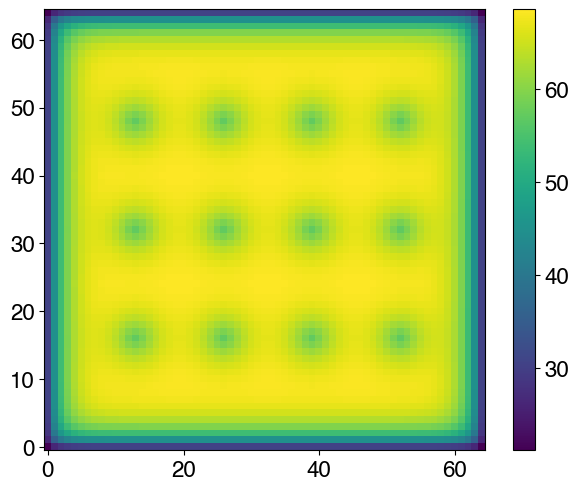

In [27]:
krigging_var = spde.get_variance(Q_init_c, cholQ_init_c).reshape(ny, nx)
plt.imshow(np.sqrt(krigging_var).T, origin="lower")
plt.colorbar()

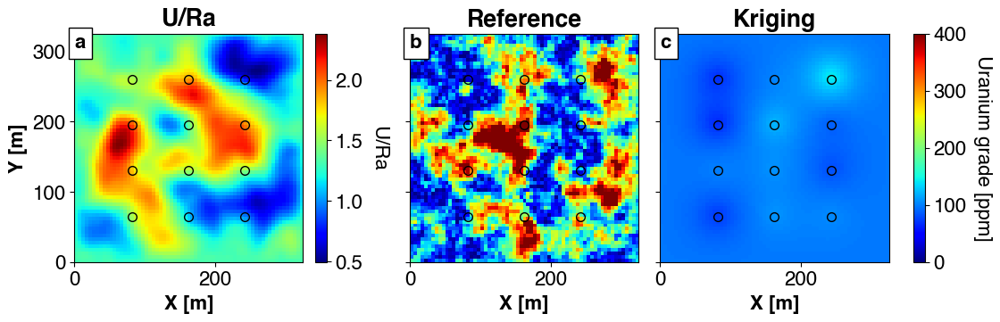

In [28]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (11, 3.5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2", "ax1-3"]], sharey=True, sharex=True)
    },
)

# 1) Plot the grades
if language == Lg.ENGLISH:
    labels = ["Reference", "Kriging"]
    cbar_title = "Uranium grade [ppm]"
else:
    labels = ["Réference", "Krigeage"]
    cbar_title = "Teneur en uranium [ppm]"

ngp.multi_imshow(
    axes=plotter.axes[1:],
    fig=plotter.fig,
    data={
        labels[0]: reference_grade_ppm,
        labels[1]: estimate_grade_simu_ppm,
    },
    cbar_title=cbar_title,
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400,
        "aspect": "equal",
    },
    xlabel="X [m]",
)

ngp.multi_imshow(
    axes=plotter.axes[:1],
    fig=plotter.fig,
    data={
        "U/Ra": krr,
    },
    cbar_title="U/Ra",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)

for ax in plotter.axes:
    # plot the sampling points here
    ax.plot(
        (dat_coords[0] + 0.5) * dx,
        (dat_coords[1] * dy),
        linestyle="None",
        marker="o",
        markersize=7,
        color="k",
        markerfacecolor="None",
    )

ngp.add_letter_to_frames(plotter.axes)

# fontsize= 16
# bbox = dict(facecolor='pink', alpha=0.2, edgecolor='red', boxstyle='square,pad=0.5')
# ax.annotate(letter, xy=(0.0, 0.0),  xytext=(0,0.5*16), color='k', va="top", ha="left", fontweight="normal", textcoords="offset points",
#         bbox=bbox)
fname = "u_grade_and_krr_ref_vs_priors"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

## Build a parametrization

- We add a abs operator to make sure that the preconditioning works fine and that the resulting field is positive

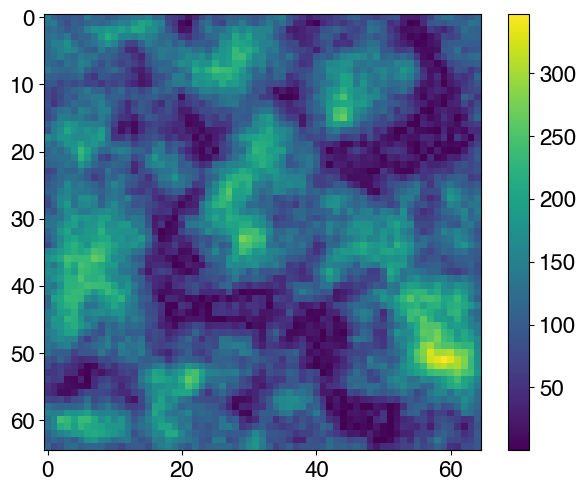

In [29]:
ne = 100
gdpcs = dminv.GDPCS(
    ne,
    Q_nc=Q_init,
    Q_c=Q_init_c,
    estimated_mean=float(estimated_mean),
    dat_nn=dat_nn,
    dat_val=dat_val_wrong,
    dat_var=dat_var_init,
    cholQ_nc=cholQ_init,
    cholQ_c=cholQ_init_c,
    random_state=2024,
    is_update_mean=True,
)

# We apply three successive preconditionning:
# 1) A first one to convert mol/kg to ppm
# 2) A second one to ensure positive values when backconditioning
# 3) A third one to convert ppm to white noise linear combinaison weights through the
# gradual deformation + SPDE approach
pcd = dminv.ChainedTransforms(
    [
        dminv.LinearTransform(slope=1 / conv_u_grade, y_intercept=0.0),
        dminv.InvAbsTransform(),
        gdpcs,
    ]
)
estimate_grade_simu_ppm = grade_mol_per_kg_to_ppm(
    pcd.backtransform(np.hstack([gdpcs.theta, gdpcs.estimated_mean])).reshape(
        nx, ny, order="F"
    )
)
plt.imshow(estimate_grade_simu_ppm)
plt.colorbar()

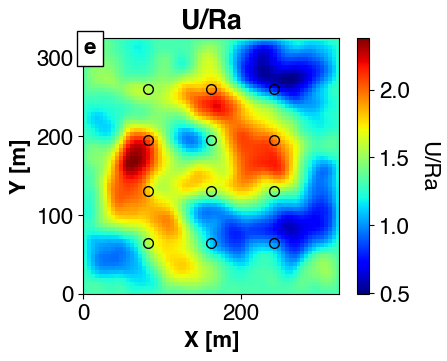

In [30]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (4.5, 3.5)},
    subplots_mosaic_params={"fig0": dict(mosaic=[["ax1-1"]], sharey=True, sharex=True)},
)

ngp.multi_imshow(
    axes=plotter.axes[:1],
    fig=plotter.fig,
    data={
        "U/Ra": krr,
    },
    cbar_title="U/Ra",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)

for ax in plotter.axes:
    # plot the sampling points here
    ax.plot(
        (dat_coords[0] + 0.5) * dx,
        (dat_coords[1] * dy),
        linestyle="None",
        marker="o",
        markersize=7,
        color="k",
        markerfacecolor="None",
    )

ngp.add_letter_to_frames(plotter.axes)
# fontsize= 16
# bbox = dict(facecolor='pink', alpha=0.2, edgecolor='red', boxstyle='square,pad=0.5')
# ax.annotate(letter, xy=(0.0, 0.0),  xytext=(0,0.5*16), color='k', va="top", ha="left", fontweight="normal", textcoords="offset points",
#         bbox=bbox)
fname = "krr"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

In [31]:
grade_ppm_to_mol_per_kg(1)

array([3.04620022e-05])

- Plot the reserves per mesh

In [32]:
def get_cell_reserves(
    u_field_grades: NDArrayFloat,
    cell_polygons: Sequence[Sequence[Tuple[float, float]]],
    nx: int,
    ny: int,
    dx: float,
    dy: float,
    dz: float,
) -> Sequence[float]:
    """Return the reserves in ton under the given technological cell.

    Parameters
    ----------
    u_field_grades : NDArrayFloat
        Uraninite grades field in ppm. 2D Array.
    dx : float
        X dimension of one mesh [m].
    dy : float
        Y dimension of one mesh [m].
    dz : float
        Z dimension of one mesh [m].
    mask: NDArrayFloat
        Mask to apply before doing the selection.
    Returns
    -------
    float
        The associated uranium reserves in t.
    """
    # flatten points coordinates
    _x, _y, _z = node_number_to_indices(np.arange(nx * ny), nx, ny)
    _x = _x * dx + dx / 2
    _y = _y * dy + dy / 2
    grid_coords = np.array((_x, _y)).T

    cell_volume = dx * dy * dz  # m3
    # Conversion factor to go from a number of ppm per unit of volume to a mass in t (all cells are the same)
    conv_factor = cell_volume * rock_density * 1e-6

    reserves_list = []

    mask_sum = None
    for cell_polygon in cell_polygons:
        # Select the mesh that belongs to the polygon
        path = mpl.path.Path(cell_polygon)
        mask = path.contains_points(grid_coords)
        if mask_sum is not None:
            mask = np.logical_and(mask, ~mask_sum)
            mask_sum = np.logical_or(mask, mask_sum)
        else:
            mask_sum = mask
        reserves_list.append(float(u_field_grades[mask].sum() * conv_factor))
    return reserves_list

- Compute the reserve associated to the cells in t
- Need to transpose for the display

In [33]:
reference_reserves_t = get_cell_reserves(
    reference_grade_ppm.T.ravel(), polygons, nx, ny, dx, dy, dz
)
estimated_reserves_simu_t = get_cell_reserves(
    estimate_grade_simu_ppm.T.ravel(), polygons, nx, ny, dx, dy, dz
)

- Compute deviations

In [34]:
initial_u_dev_simu = np.sum(estimated_reserves_simu_t) - np.sum(reference_reserves_t)
initial_u_dev_simu_frac = initial_u_dev_simu / np.sum(reference_reserves_t)

logging.info(
    f"initial_U_dev_simu = {initial_u_dev_simu:.2f} t ({initial_u_dev_simu_frac * 100:.2f}%)"
)

INFO:root:initial_U_dev_simu = -29.86 t (-48.39%)


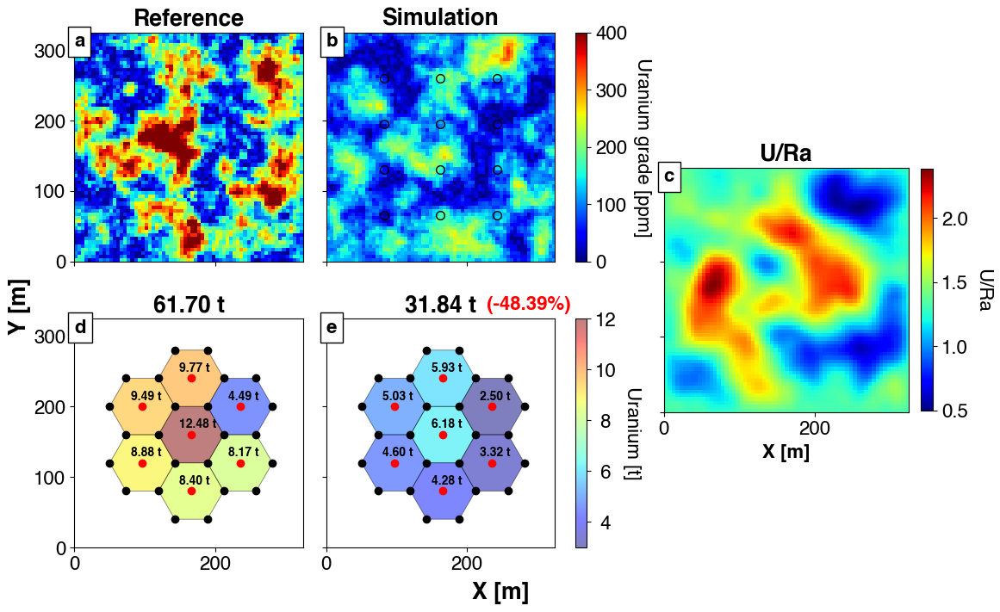

In [35]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (11.5, 7)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax2-1", "ax3-1"], ["ax1-2", "ax2-2", "ax3-1"]],
            sharey=True,
            sharex=True,
        ),
    },
)

# 1) Plot the grades
if language == Lg.ENGLISH:
    labels = ["Reference", "Simulation"]
    cbar_title = "Uranium grade [ppm]"
else:
    labels = ["Réference", "Simulation"]
    cbar_title = "Teneur en uranium [ppm]"

cbar_up = ngp.multi_imshow(
    axes=plotter.axes[:2],
    fig=plotter.fig,
    data={
        labels[0]: reference_grade_ppm,
        labels[1]: estimate_grade_simu_ppm,
    },
    cbar_title=cbar_title,
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
        "aspect": "equal",
    },
    cbar_kwargs={"pad": 0.01},
)

# plot the sampling points here
plotter.axes[1].plot(
    (dat_coords[0] + 0.5) * dx,
    (dat_coords[1] * dy),
    linestyle="None",
    marker="o",
    markersize=7,
    color="k",
    markerfacecolor="None",
)

# 2) Plot the reserves
for _n, (ax, reserves) in enumerate(
    zip(
        [plotter.axes[3], plotter.axes[-1]],
        (
            reference_reserves_t,
            estimated_reserves_simu_t,
        ),
    )
):
    for i, j in inj_grid_coordinates:
        ax.plot(i, j, "ko")

    for i, j in prod_grid_coordinates:
        ax.plot(i, j, "ro")

    patches = []
    for i, cell_polygon in enumerate(polygons):
        # Add the polygon to the collection of patches
        xy = np.array(cell_polygon)
        patches.append(Polygon(xy, closed=True, facecolor=None))

        centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

        ax.text(*centroid, f"{reserves[i]:.2f} t", fontsize=10, fontweight="bold")

        # Plot the number of the polygon
    p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("jet"))
    # p.set_facecolors("white")
    p.set_edgecolors("black")
    p.set_linewidth(0.6)
    p.set_linestyle("-")
    p.set_array(np.array(reserves, dtype=float))
    p.set_clim(3, 12)
    ax.add_collection(p)

    # Add the tonnages
    tmp = ax.set_title(f"{np.sum(reserves):.2f} t", fontweight="bold")

    if _n != 0:
        # Absolute deviation
        ton_diff_abs = np.sum(reserves) - np.sum(reference_reserves_t)
        # Relative deviation
        ton_diff_rel = ton_diff_abs / np.sum(reference_reserves_t)

        pos = tmp.get_position()
        txt = ax.text(
            pos[0] + 0.2,
            pos[1] + 0.04,
            f"({ton_diff_rel * 100:+.2f}%)",
            fontweight="bold",
            transform=ax.transAxes,
            color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
        )
        # txt.set_bbox(tmp.get_bbox_patch().get_boxstyle())

# Add a common colorbar
cbar = plotter.fig.colorbar(
    p,
    ax=[plotter.axes[3], plotter.axes[-1]],
    orientation="vertical",
    fraction=0.1,
    format="%2.f",
    pad=0.01,
)
cbar.ax.get_yaxis().labelpad = 20
cbar.ax.set_ylabel("Uranium [t]", rotation=270)

# 3) Plot the U/Ra
cbar = ngp.multi_imshow(
    axes=plotter.axes[2:3],
    fig=plotter.fig,
    data={
        "U/Ra": krr,
    },
    cbar_title="U/Ra",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    cbar_kwargs={"shrink": 0.47},
    xlabel="X [m]",
    # ylabel="Y [m]",
)

# Box dimensions
for ax in plotter.ax_dict.values():
    ax.set_xlim(0, nx * dx)
    ax.set_ylim(0, ny * dy)
    ax.set_aspect("equal", adjustable="box")

# plotter.fig.suptitle("Grades and tonnages", fontweight="bold", fontsize=22)
plotter.fig.supxlabel("X [m]", fontweight="bold")
plotter.fig.supylabel("Y [m]", fontweight="bold")

ngp.add_letter_to_frames(plotter.axes)

fname = "reserves_+_grades_per_cells_+_URa"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

## Forward problem in demonstrator

In [36]:
time_params = dmfwd.TimeParameters(
    duration=duration_in_seconds,
    dt_init=dt_init,
    dt_min=dt_min,
    dt_max=dt_max,
    courant_factor=courant_factor,
)
geometry = dmfwd.Geometry(nx=nx, ny=ny, dx=dx, dy=dx)
fl_params = dmfwd.FlowParameters(
    permeability=permeability,
    storage_coefficient=storage_coefficient,
    regime=dmfwd.FlowRegime.TRANSIENT,
    tolerance=1e-10,
)
tr_params = dmfwd.TransportParameters(
    diffusion=diffusion_coef,
    porosity=porosity,
    crank_nicolson_diffusion=1.0,
    crank_nicolson_advection=0.5,
    tolerance=1e-12,
    fpi_eps=1e-5,
    is_numerical_acceleration=True,
)
gch_params = dmfwd.GeochemicalParameters(
    conc=c0, grade=M0, kv=kv, As=As, Ks=Ks, stocoef=200.0
)

base_model = dmfwd.ForwardModel(geometry, time_params, fl_params, tr_params, gch_params)

- Add source and sink terms

In [37]:
flw_times_in_s = np.arange(duration_in_days + 1) * 3600 * 24.0
prod_flw = -flowrates / 3600  # m3/h to m3/s
# times = np.arange(stop=nt + 1, start=0) * dt

for count_prod, (ix, iy) in enumerate(prod_grid_indices):
    name = f"producer_{ix}_{iy}"

    sink_term = dmfwd.SourceTerm(
        name,
        node_ids=np.array([indices_to_node_number(ix, nx, iy)]),
        times=flw_times_in_s,
        flowrates=prod_flw,
        concentrations=np.zeros((*prod_flw.shape, 2)),
    )
    base_model.add_src_term(sink_term)

for count_inj, (ix, iy) in enumerate(inj_grid_indices):
    x, y = inj_grid_coordinates[count_inj]
    name = f"injector_{ix}_{iy}"

    nb_prod_well_linked = 0
    # Find the number of producers that the injector is linked with
    for xp, yp in prod_grid_coordinates:
        # we take 20% margin on the cell radius
        if np.sqrt((x - xp) ** 2 + (y - yp) ** 2) < cell_radius * 1.2:
            nb_prod_well_linked += 1

    # NOTE: need to inject a non null quantity to avoid numerical issues
    inj_conc = np.zeros((*prod_flw.shape, 2))
    inj_conc[:, 1] = _inj_conc
    inj_conc[inj_conc < 0] = 1e-10

    source_term = dmfwd.SourceTerm(
        name,
        node_ids=np.array([indices_to_node_number(ix, nx, iy)]),
        times=flw_times_in_s,
        flowrates=-prod_flw
        / 6.0
        * nb_prod_well_linked,  # /6.0 because of hexagonal cells
        concentrations=inj_conc,  # injection concentration
    )
    base_model.add_src_term(source_term)

- Check the hydraulic balance

In [38]:
total_prod_flow = 0
total_inj_flow = 0

for source_term in base_model.source_terms:
    _dt = np.diff(flw_times_in_s)  # timesteps in s
    total_inj_flow += np.sum(
        np.where(source_term.flowrates > 0, source_term.flowrates, 0.0)[1:] * _dt
    )
    total_prod_flow += np.sum(
        np.where(source_term.flowrates < 0, -source_term.flowrates, 0.0)[1:] * _dt
    )

print(f"total_prod_flow = {total_prod_flow} m3")
print(f"total_inj_flow = {total_inj_flow} m3")

# This test should fail if there is any issue !
assert np.round(total_prod_flow, 4) == np.round(total_inj_flow, 4)

total_prod_flow = 77059.83421304212 m3
total_inj_flow = 77059.83421304215 m3


In [39]:
source_term.times.size

61

- Add boundary conditions

In [40]:
# # west
# base_model.add_boundary_conditions(dmfwd.ConstantHead(span=(slice(0, 1), slice(None))))
# # est
# base_model.add_boundary_conditions(
#     dmfwd.ConstantHead(span=(slice(nx - 1, nx), slice(None)))
# )
# # south
# base_model.add_boundary_conditions(dmfwd.ConstantHead(span=(slice(None), slice(0, 1))))
# # north
# base_model.add_boundary_conditions(
#     dmfwd.ConstantHead(span=(slice(None), slice(nx - 1, nx)))
# )

In [41]:
model_reference = copy.deepcopy(base_model)
model_estimate = copy.deepcopy(base_model)

# Exact initial uranium grade
model_reference.tr_model.set_initial_grade(grade_ppm_to_mol_per_kg(reference_grade_ppm))
# Estimated initial uranim grade
model_estimate.tr_model.set_initial_grade(
    grade_ppm_to_mol_per_kg(estimate_grade_simu_ppm)
)

- Run the models

In [42]:
solver_reference = dmfwd.ForwardSolver(model_reference)
solver_reference.solve(is_verbose=False)

In [43]:
solver_estimate_simu = dmfwd.ForwardSolver(model_estimate)
solver_estimate_simu.solve(is_verbose=False)

KeyboardInterrupt: 

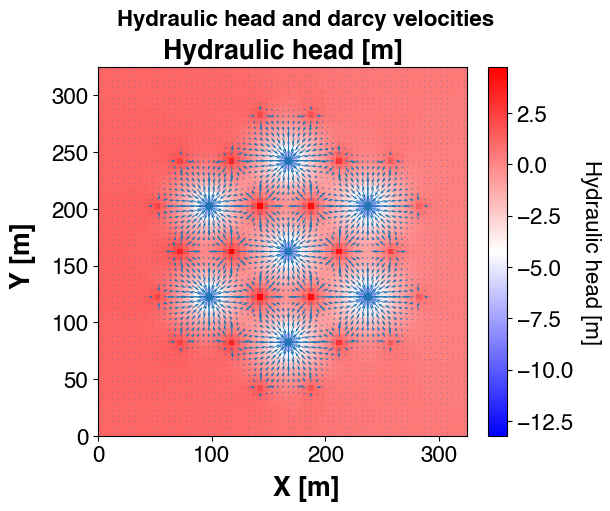

In [44]:
time_index_1 = 10
time_index_2 = 20

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (6, 5)},
    # subfigs_params={"nrows": 1},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1"]], sharey=True, sharex=True),
    },
)

if language == Lg.ENGLISH:
    label = "Hydraulic head [m]"
else:
    label = "Charges hydrauliques [m]"

ngp.multi_imshow(
    axes=plotter.axes,
    fig=plotter.fig,
    data={
        label: model_estimate.fl_model.head[:, :, time_index_1],
        #         "Head [m] 2": model_estimate.fl_model.head[:, :, time_index_2],
    },
    cbar_title=label,
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)

for ax, time_index in zip(plotter.axes, [time_index_1, time_index_2]):
    Y, X = np.meshgrid((np.arange(nx) + 0.5) * dx, (np.arange(ny) + 0.5) * dy)
    ax.quiver(
        X,
        Y,
        model_estimate.fl_model.u_darcy_x_center[:, :, time_index],
        model_estimate.fl_model.u_darcy_y_center[:, :, time_index],
        color="C0",
        scale_units="xy",
    )

if language == Lg.ENGLISH:
    title = "Hydraulic head and darcy velocities"
else:
    title = "Charges hydrauliques et vitesses de darcy"
plotter.subfigs["fig0"].suptitle(title, fontweight="bold", fontsize=16)
plotter.subfigs["fig0"].supxlabel("X [m]", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Y [m]", fontweight="bold")

fname = "heads_and_velocities"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Plot the concentration evolution

## Observations and associated uncertainties

- We select only 10% of the data points available to get something more realistic

In [ ]:
freq_measure_in_days = 6  # one measure every four days
n_sampled_days = duration_in_days_inv / freq_measure_in_days

obs_times_in_s = np.arange(n_sampled_days) * 3600 * 24 * freq_measure_in_days
obs_times_in_d = obs_times_in_s / 3600 / 24
obs_times_in_s

array([      0.,  518400., 1036800., 1555200., 2073600., 2592000.,
       3110400., 3628800., 4147200., 4665600.])

In [ ]:
model_estimate.tr_model.conc.shape

(65, 65, 132)

In [ ]:
np.count_nonzero(model_estimate.tr_model.conc2 < 0.0)

6

- Create a function to add some noise to the observations

In [ ]:
noise_std: float = 5e-6  # This is an absolute value


def get_white_noise(shape: Iterable[int]) -> NDArrayFloat:
    """
    Return the input with some added white noise.

    Note
    ----
    The parameters are hardcoded to be consistent in the notebook.
    Change the function directly.
    """
    mean_noise = 0.0  # mean
    return np.random.default_rng(2021).normal(
        mean_noise, noise_std, size=np.array(shape)
    )


# Generate a white noise
obs_noise: NDArrayFloat = get_white_noise((len(prod_grid_indices), obs_times_in_s.size))

- Noise in mg/l

In [ ]:
conc_molpl_to_mgpl(noise_std)

array(1.350134)

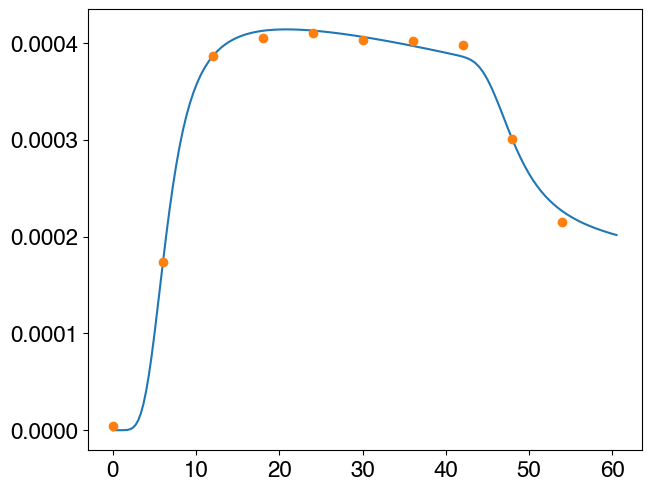

In [ ]:
simu_times_ref_in_s = model_reference.time_params.times
simu_times_ref_in_d = simu_times_ref_in_s / 3600 / 24

simu_times_est_in_s = model_estimate.time_params.times
simu_times_est_in_d = simu_times_est_in_s / 3600 / 24

obs_values = np.zeros((len(prod_grid_indices), obs_times_in_s.size))

for count, (ix, iy) in enumerate(prod_grid_indices):
    # interpolate the values
    obs_values[count] = (
        interp1d(
            simu_times_ref_in_s, model_reference.tr_model.conc[ix, iy, :], kind="cubic"
        )(obs_times_in_s)
        + obs_noise[count, :]
    )

count = 2

ix, iy = prod_grid_indices[count]
plt.plot(simu_times_ref_in_d, model_reference.tr_model.conc[ix, iy, :])
plt.plot(
    obs_times_in_d,
    obs_values[count],
    marker="o",
    linestyle="none",
)

- count the number of observations

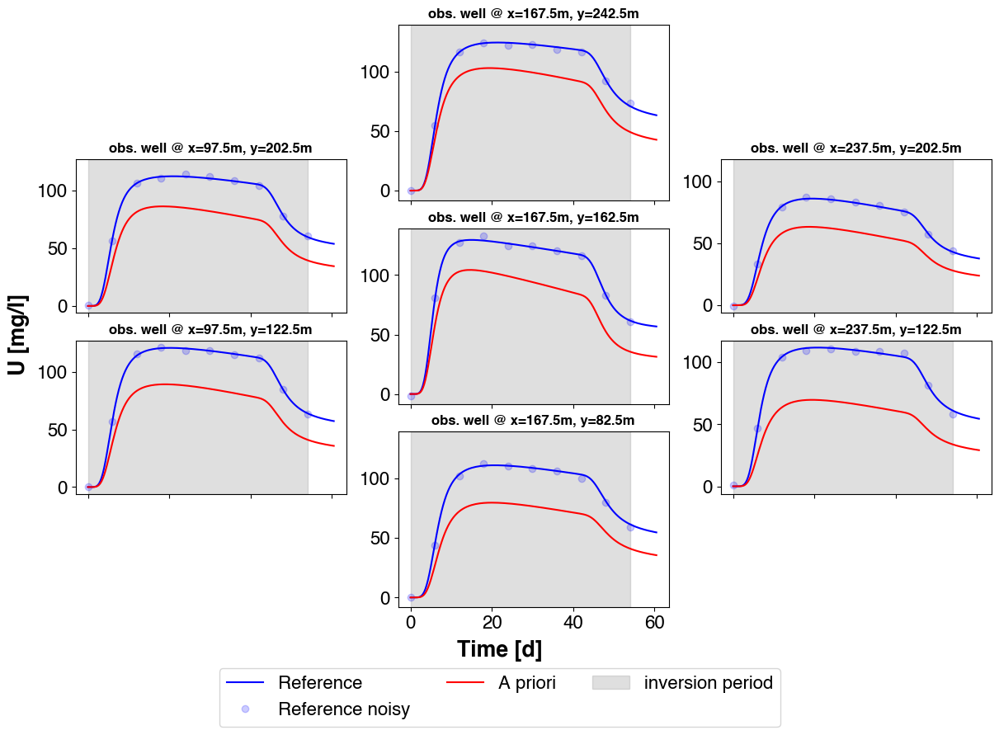

In [ ]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(zip(prod_grid_indices, obs_plot_locations)):
    x = (ix + 0.5) * dx
    y = (iy + 0.5) * dy

    if language == Lg.ENGLISH:
        obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
    else:
        obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

    ax = plotter.ax_dict[ax_name]
    ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

    if language == Lg.ENGLISH:
        labels = ["Reference", "Reference noisy", "A priori"]
    else:
        labels = ["Réference", "Réference bruitée", "A priori"]

    data = {
        labels[0]: {
            "x": simu_times_ref_in_d,
            "y": conc_molpl_to_mgpl(model_reference.tr_model.conc[ix, iy, :]),
            "kwargs": {"c": "b", "linestyle": "-"},
        },
        labels[1]: {
            "x": obs_times_in_d,
            "y": conc_molpl_to_mgpl(obs_values[count]),
            "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
        },
        labels[2]: {
            "x": simu_times_est_in_d,
            "y": conc_molpl_to_mgpl(model_estimate.tr_model.conc[ix, iy, :]),
            "kwargs": {"c": "r", "linestyle": "-"},
        },
    }

    for k, v in data.items():
        ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

    # ax.set_xlabel("Time", fontweight="bold")
    # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

    if language == Lg.ENGLISH:
        ax.axvspan(
            0,
            obs_times_in_d[-1],
            color="grey",
            alpha=0.25,
            label="inversion period",
        )
    else:
        ax.axvspan(
            0,
            obs_times_in_d[-1],
            color="grey",
            alpha=0.25,
            label="Période inversion",
        )

plotter.add_fig_legend(ncol=3)

if language == Lg.ENGLISH:
    plotter.fig.supxlabel("Time [d]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")
else:
    plotter.fig.supxlabel("Temps [j]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")

fname = "U_at_producers_before_inv"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

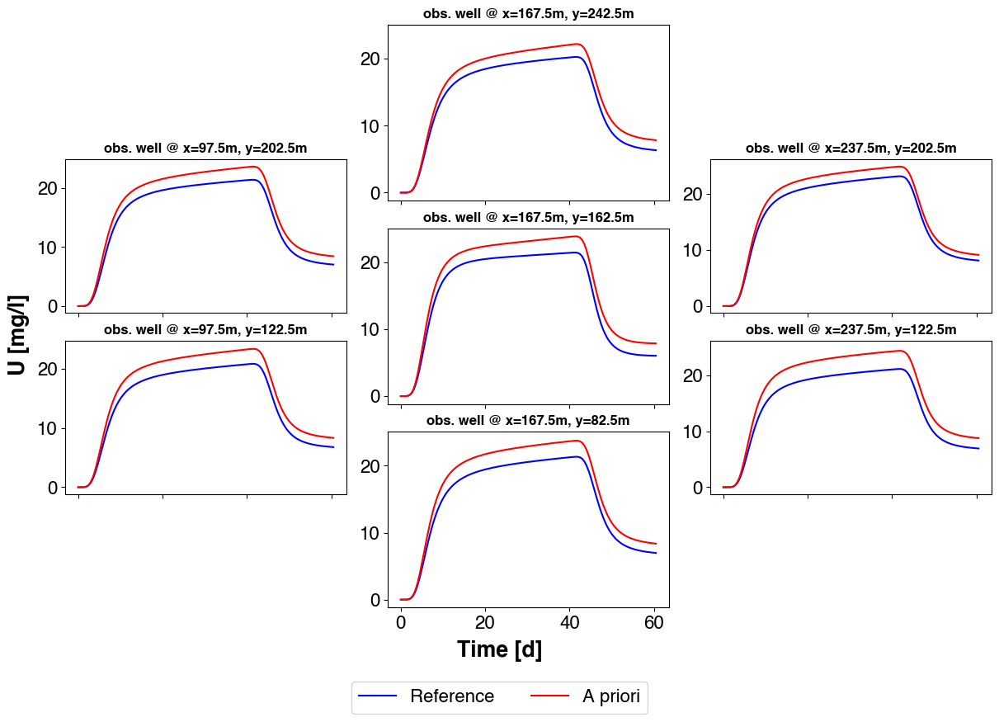

In [ ]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(zip(prod_grid_indices, obs_plot_locations)):
    x = (ix + 0.5) * dx
    y = (iy + 0.5) * dy

    if language == Lg.ENGLISH:
        obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
    else:
        obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

    ax = plotter.ax_dict[ax_name]
    ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

    if language == Lg.ENGLISH:
        labels = ["Reference", "Reference noisy", "A priori"]
    else:
        labels = ["Réference", "Réference bruitée", "A priori"]

    data = {
        labels[0]: {
            "x": simu_times_ref_in_d,
            "y": conc_h2so4_molpl_to_gpl(model_reference.tr_model.conc2[ix, iy, :]),
            "kwargs": {"c": "b", "linestyle": "-"},
        },
        # labels[1]: {
        #     "x": obs_times_in_d,
        #     "y": conc_molpl_to_mgpl(obs_values[count]),
        #     "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
        # },
        labels[2]: {
            "x": simu_times_est_in_d,
            "y": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.conc2[ix, iy, :]),
            "kwargs": {"c": "r", "linestyle": "-"},
        },
    }

    for k, v in data.items():
        ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

    # ax.set_xlabel("Time", fontweight="bold")
    # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

plotter.add_fig_legend(ncol=3)

if language == Lg.ENGLISH:
    plotter.fig.supxlabel("Time [d]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")
else:
    plotter.fig.supxlabel("Temps [j]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")

fname = "H2SO4_at_producers_before_inv"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Plot the concentrations and grades for the reference

In [ ]:
def get_frame_time_label(
    nb_frames: int, ltimes: List[float]
) -> Generator[str, None, None]:
    """
    Generator of time labels (in d).

    Parameters
    ----------
    nb_frames : int
        Number of frames in the animation.
    ltimes : List[float]
        List of times. The length of the list must be equal or greater than `nb_frames`.
        Times are expected in seconds.

    Yields
    ------
    Generator[str, None, None]
    """
    # subtract -1 to nb_steps and _nb_frames so that when
    # frame_index = 0, we get the first element of ltimes, and when
    # frame_index = _nb_frames - 1, we get the last element of ltimes.
    ts_btw_frames = (len(ltimes) - 1) / (nb_frames - 1)
    for frame in range(nb_frames):
        yield f"time = {ltimes[int(ts_btw_frames * frame)] / 3600 / 24:.1f} d"

In [ ]:
# 1) creation du plotter avec 2 graphiques sur une rangée
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

# 2) ici model_estimate.time_params.nt est le nombre de timesteps, le nombre de frames est donc au max 15.
nb_frames = min(model_estimate.time_params.nt, 15)

# 3) Animation des deux graphiques
# Ici conc_molpl_to_mgpl(model_reference.tr_model.conc) et conc_molpl_to_mgpl(model_estimate.tr_model.conc)
# sont des np.array 3D avec pour dim (nx, ny, nt)
plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_molpl_to_mgpl(model_reference.tr_model.conc),
        "Initial guess": conc_molpl_to_mgpl(model_estimate.tr_model.conc),
    },
    cbar_title="UO2[2+] [mg/l]",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

# 4) Ajout d'un titre à la figure
plotter.subfigs["fig0"].suptitle("UO2[2+] [mg/l]", fontweight="bold")

# 5) Ajout d'un texte animé avec le temps correspondant à l'image
plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

# On ferme (ça c'est requis dans les notebook) puis on anime
plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "UO2[2+]_conc_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation -> jupyter
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_h2so4_molpl_to_gpl(model_reference.tr_model.conc2),
        "Initial guess": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.conc2),
    },
    cbar_title="H2SO4 [g/l]",
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy]},
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("H2SO4 [g/l]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "H2SO4_conc_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": grade_mol_per_kg_to_ppm(model_reference.tr_model.grade),
        "Initial guess": grade_mol_per_kg_to_ppm(model_estimate.tr_model.grade),
    },
    cbar_title="UO2 [ppm]",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("UO2 [ppm]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "UO2_grade_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

mesh_volume_in_l = geometry.dx * geometry.dy * geometry.dz * porosity * 1000
gpl_to_t = mesh_volume_in_l / 1e6

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_h2so4_molpl_to_gpl(model_reference.tr_model.grade2)
        * gpl_to_t,
        "Initial guess": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.grade2)
        * gpl_to_t,
    },
    cbar_title="H2SO4 consummed [t]",
    imshow_kwargs={
        "cmap": plt.get_cmap("plasma"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        # "vmin": 0.0,
        # "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("H2SO4 consummed [t]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "H2SO4_consumption_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


- Define a function to plot the results afterwards

In [ ]:
def plot_inv_res_conc_at_producers(
    *,
    ref_model: dmfwd.ForwardModel,
    prior_model: dmfwd.ForwardModel,
    inversed_model: dmfwd.ForwardModel,
    case_name: str,
    sp: int = 0,
) -> ngp.NestedGridPlotter:
    """

    Parameters
    ----------
    ref_model : _type_
        _description_
    prior_model : _type_
        _description_
    inversed_model : _type_
        _description_

    Returns
    -------
    NestedGridPlotter
        _description_
    """
    # Indicate the order in which to plot
    obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

    plotter = ngp.NestedGridPlotter(
        fig_params={"constrained_layout": True, "figsize": (12, 8)},
        subfigs_params={
            "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
        },
        subplots_mosaic_params={
            "left_col": dict(
                mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
                gridspec_kw=dict(
                    height_ratios=[1.0, 1.2, 1.2, 1.0],
                ),
                sharey=True,
                sharex=True,
            ),
            "centered_col": dict(
                mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
            ),
            "right_col": dict(
                mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
                gridspec_kw=dict(
                    height_ratios=[1.0, 1.2, 1.2, 1.0],
                ),
                sharey=True,
                sharex=True,
            ),
        },
    )

    # hide axes and borders
    plotter.ax_dict["ghost1"].axis("off")
    plotter.ax_dict["ghost2"].axis("off")
    plotter.ax_dict["ghost3"].axis("off")
    plotter.ax_dict["ghost4"].axis("off")

    # Static plot
    for count, ((ix, iy), ax_name) in enumerate(
        zip(prod_grid_indices, obs_plot_locations)
    ):
        x = (ix + 0.5) * dx
        y = (iy + 0.5) * dy

        if language == Lg.ENGLISH:
            obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
        else:
            obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

        ax = plotter.ax_dict[ax_name]
        ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

        if language == Lg.ENGLISH:
            labels = [
                "Reference",
                "Reference noisy",
                "A priori",
                f"Post-inversion ({case_name})",
            ]
        else:
            labels = [
                "Réference",
                "Réference bruitée",
                "A priori",
                f"Post-inversion ({case_name})",
            ]

        data = {
            labels[0]: {
                "x": simu_times_ref_in_d,
                "y": conc_molpl_to_mgpl(ref_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "b", "linestyle": "-", "alpha": 0.25},
            },
            labels[1]: {
                "x": obs_times_in_d,
                "y": conc_molpl_to_mgpl(obs_values[count]),
                "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
            },
            labels[2]: {
                "x": simu_times_est_in_d,
                "y": conc_molpl_to_mgpl(prior_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "r"},
            },
            labels[3]: {
                "x": simu_times_est_in_d,
                "y": conc_molpl_to_mgpl(inversed_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "g", "linestyle": "--"},
            },
        }

        for k, v in data.items():
            if v["x"].shape[0] != v["y"].shape[0]:
                print(k)
            ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

        # ax.set_xlabel("Time", fontweight="bold")
        # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

        # Add the end of inversion
        # ax.axvline(x=time_all[obs_time_idx][-1], linestyle="--", color="k", label="fin d'inversion", alpha=0)

        if language == Lg.ENGLISH:
            ax.axvspan(
                0,
                obs_times_in_d[-1],
                color="grey",
                alpha=0.25,
                label="inversion period",
            )
        else:
            ax.axvspan(
                0,
                obs_times_in_d[-1],
                color="grey",
                alpha=0.25,
                label="Période inversion",
            )

    plotter.add_fig_legend(ncol=3)

    if language == Lg.ENGLISH:
        plotter.fig.supxlabel("Time [d]", fontweight="bold")
        plotter.fig.supylabel("U [mg/l]", fontweight="bold")
    else:
        plotter.fig.supxlabel("Temps [j]", fontweight="bold")
        plotter.fig.supylabel("U [mg/l]", fontweight="bold")

    fname = f"U_at_producers_post_inv_{case_name}"
    for format in ["png", "pdf"]:
        plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
    return plotter

In [ ]:
def plot_inv_res_grade_and_reserves(
    *,
    ref_grade: NDArrayFloat,
    prior_grade: NDArrayFloat,
    inversed_grade: NDArrayFloat,
    case_name: str,
) -> ngp.NestedGridPlotter:
    plotter = ngp.NestedGridPlotter(
        fig_params={"constrained_layout": True, "figsize": (15, 7)},
        subplots_mosaic_params={
            "fig0": dict(
                mosaic=[
                    ["ax1-1", "ax1-2", "ax1-3", "ax1-4"],
                    ["ax2-1", "ax2-2", "ax2-3", "ax2-4"],
                ],
                sharey=True,
                sharex=True,
            )
        },
    )

    data = {
        "Reference": ref_grade,
        "Cond sim dat": prior_grade,
        "inverted": inversed_grade,
    }

    data_reserves = {}
    for k, v in data.items():
        data_reserves[k] = get_cell_reserves(v.T.ravel(), polygons, nx, ny, dx, dy, dz)

    # 1) Plot the grades: only for the three first frames
    cbar_up = ngp.multi_imshow(
        axes=plotter.axes[:3],
        fig=plotter.fig,
        data=data,
        cbar_title="Uranium grade [ppm]",
        imshow_kwargs={
            "cmap": plt.get_cmap("jet"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": 0.0,
            "vmax": 400.0,
        },
    )

    # red = over-estimation, blue = underestimation
    cbar_up2 = ngp.multi_imshow(
        axes=plotter.axes[3:4],
        fig=plotter.fig,
        data={"Residuals": inversed_grade - ref_grade},
        cbar_title="Uranium grade [ppm]",
        imshow_kwargs={
            "cmap": plt.get_cmap("bwr"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": -500,
            "vmax": 500,
        },
        is_symmetric_cbar=True,
    )

    # For all frames
    for ax in plotter.axes[:4]:
        # plot the sampling points here
        ax.plot(
            (dat_coords[0] + 0.5) * dx,
            (dat_coords[1] * dy),
            linestyle="None",
            marker="o",
            markersize=7,
            color="k",
            markerfacecolor="None",
        )

    # 2) Plot the reserves (not for the last frame)
    for _n, ax in enumerate(plotter.axes[4:7]):
        reserves = list(data_reserves.values())[_n]

        for i, j in inj_grid_coordinates:
            ax.plot(i, j, "ko")

        for i, j in prod_grid_coordinates:
            ax.plot(i, j, "ro")

        patches = []
        for i, cell_polygon in enumerate(polygons):
            # Add the polygon to the collection of patches
            xy = np.array(cell_polygon)
            patches.append(Polygon(xy, closed=True, facecolor=None))

            centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

            ax.text(*centroid, f"{reserves[i]:.2f} t", fontsize=10, fontweight="bold")

            # Plot the number of the polygon
        p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("jet"))
        # p.set_facecolors("white")
        p.set_edgecolors("black")
        p.set_linewidth(0.6)
        p.set_linestyle("-")
        p.set_array(np.array(reserves, dtype=float))
        p.set_clim(3, 12)
        ax.add_collection(p)

        # Add the tonnages
        tmp = ax.set_title(f"{np.sum(reserves):.2f} t", fontweight="bold")

        if _n != 0:
            # Absolute deviation
            ton_diff_abs = np.sum(reserves) - np.sum(reference_reserves_t)
            # Relative deviation
            ton_diff_rel = ton_diff_abs / np.sum(reference_reserves_t)

            pos = tmp.get_position()
            txt = ax.text(
                pos[0] + 0.2,
                pos[1] + 0.04,
                f"({ton_diff_rel * 100:+.2f}%)",
                fontweight="bold",
                transform=ax.transAxes,
                color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
            )
            # txt.set_bbox(tmp.get_bbox_patch().get_boxstyle())

    # Add a common colorbar for the reserves per cell
    cbar = plotter.fig.colorbar(
        p, ax=plotter.axes[4:7], orientation="vertical", fraction=0.1, format="%2.f"
    )
    cbar.ax.get_yaxis().labelpad = 20
    cbar.ax.set_ylabel("Uranium [t]", rotation=270)

    # 3) Plot the reserves deviation for the last frame
    ax = plotter.axes[-1]
    reserves = list(data_reserves.values())[-1]
    _reserves_dev = [
        reserves[i] - reference_reserves_t[i] for i in range(len(reserves))
    ]

    for i, j in inj_grid_coordinates:
        ax.plot(i, j, "ko")

    for i, j in prod_grid_coordinates:
        ax.plot(i, j, "ro")

    patches = []
    for i, cell_polygon in enumerate(polygons):
        # Add the polygon to the collection of patches
        xy = np.array(cell_polygon)
        patches.append(Polygon(xy, closed=True, facecolor=None))

        centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

        ax.text(*centroid, f"{_reserves_dev[i]:.2f} t", fontsize=10, fontweight="bold")

        # Plot the number of the polygon
    p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("bwr"))
    # p.set_facecolors("white")
    p.set_edgecolors("black")
    p.set_linewidth(0.6)
    p.set_linestyle("-")
    p.set_array(np.array(_reserves_dev, dtype=float))
    p.set_clim(-1.5, 1.5)
    ax.add_collection(p)

    # Add the average cell deviation
    tmp = ax.set_title(
        f"\u00b1{np.mean(np.abs(_reserves_dev)):.2f} t", fontweight="bold"
    )

    # Relative deviation
    ton_diff_rel = np.mean(
        np.abs(
            [_reserves_dev[i] / reference_reserves_t[i] for i in range(len(reserves))]
        )
    )

    pos = tmp.get_position()
    txt = ax.text(
        pos[0] + 0.2,
        pos[1] + 0.04,
        f"(\u00b1{ton_diff_rel * 100:.2f}%)",
        fontweight="bold",
        transform=ax.transAxes,
        color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
    )

    # Add a common colorbar
    cbar = plotter.fig.colorbar(
        p, ax=plotter.axes[7:], orientation="vertical", fraction=0.1, format="%2.f"
    )
    cbar.ax.get_yaxis().labelpad = 20
    if language == Lg.ENGLISH:
        cbar_title = "Uranium deviation [t]"
    else:
        cbar_title = "Différence [t]"
    cbar.ax.set_ylabel(cbar_title, rotation=270)

    # Box dimensions
    for ax in plotter.ax_dict.values():
        ax.set_xlim(0, nx * dx)
        ax.set_ylim(0, ny * dy)
        ax.set_aspect("equal", adjustable="box")

    # plotter.fig.suptitle("Grades and tonnages", fontweight="bold", fontsize=22)
    plotter.fig.supxlabel("X [m]", fontweight="bold")
    plotter.fig.supylabel("Y [m]", fontweight="bold")

    fname = f"reserves_and_grades_per_cells_post_inv_{case_name}"
    for format in ["png", "pdf"]:
        plotter.fig.savefig(
            str(fig_save_path.joinpath(f"{fname}.{format}")), format=format
        )
    return plotter

## Inversion tests

- Define a threshold (minimum objective function)

In [ ]:
logging.info("Performing inversion tests")

INFO:root:Performing inversion tests


In [ ]:
# We apply the criteria by
# threshold_loss = 1e-3  # we want to reduce the initial loss function a hundred times


def threshold_loss_fct(observables: List[dminv.Observable], n_std: float = 2) -> float:
    """
    The threshold for the loss function is given by Gao et al. 2006.

    It is propotionnal to the number of observations. And assume that the observation
    noise is well known.
    """
    n_obs = np.sum([obs.values.size for obs in observables])
    return 0.5 * n_obs + n_std * np.sqrt(0.5 * n_obs)

In [ ]:
# if is_run_asm:

#     adjusted_param_adjoint = dminv.AdjustableParameter(
#         name=dminv.ParameterName.INITIAL_GRADE,
#         lbounds=0.0,
#         ubounds=float(grade_ppm_to_mol_per_kg(700.0)[0]),
#         # filters=[GaussianFilter(sigmas=(2.0))],
#         preconditioner=pcd,
#         sp=0,
#     )

#     observables = []
#     for i, (ix, iy) in enumerate(prod_grid_indices):
#         # Careful not to forget the x2

#         observables.append(
#             dminv.Observable(
#                 state_variable=dminv.StateVariable.CONCENTRATION,
#                 node_indices=indices_to_node_number(ix, nx, iy),
#                 times=obs_times_in_s,
#                 values=obs_values[i],
#                 uncertainties=noise_std,
#                 sp=0,
#             )
#         )

#     # Create an executor to keep track of the adjoint model
#     solver_config_adjoint = dminv.ScipySolverConfig(
#         solver_name="L-BFGS-B",
#         solver_options={
#             "maxfun": 10,
#             "maxiter": 10,
#             "ftol": threshold_loss,
#             "gtol": 1e-6,
#         },
#         is_check_gradient=False,
#         max_optimization_round_nb=1,
#         max_fun_first_round=5,
#         max_fun_per_round=15,
#         is_regularization_at_first_round=False,
#         reg_factor=0.2 # dminv.regularization.RegWeightUpdateStrategy.ADAPTIVE_UC,
#     )
#     model_adjusted_adjoint = copy.deepcopy(model_estimate)
#     model_adjusted_adjoint.time_params.duration = duration_in_seconds_inv

#     inverse_model_adjoint = dminv.InverseModel(adjusted_param_adjoint, observables)
#     executor_adjoint = dminv.ScipyInversionExecutor(
#         model_adjusted_adjoint, inverse_model_adjoint, solver_config_adjoint
#     )

#     # Compute a first objective function
#     executor_adjoint.eval_scaled_loss(
#         get_param_values(adjusted_param_adjoint, is_preconditioned=True),
#         is_save_state=False,
#     )

# is_gradient_correct = executor_adjoint.is_adjoint_gradient_correct(max_workers=99)

In [ ]:
# logging.info(f"is gradient correct = {is_gradient_correct}")

In [64]:
if is_run_asm:
    logging.info("Data assimilation with ASM, GD + SPDE conditioning")

    adjusted_param_adjoint = dminv.AdjustableParameter(
        name=dminv.ParameterName.INITIAL_GRADE,
        lbounds=0.0,
        ubounds=float(grade_ppm_to_mol_per_kg(2000.0)[0]),
        # filters=[GaussianFilter(sigmas=(2.0))],
        preconditioner=pcd,
        sp=0,
    )

    observables = []
    for i, (ix, iy) in enumerate(prod_grid_indices):
        # Careful not to forget the x2

        observables.append(
            dminv.Observable(
                state_variable=dminv.StateVariable.CONCENTRATION,
                node_indices=indices_to_node_number(ix, nx, iy),
                times=obs_times_in_s,
                values=obs_values[i],
                uncertainties=noise_std,
                sp=0,
            )
        )

    # Create an executor to keep track of the adjoint model
    solver_config_adjoint = dminv.LBFGSBSolverConfig(
        maxfun=20,
        maxiter=20,
        ftol=threshold_loss_fct(observables, 2),
        is_check_gradient=False,
    )
    model_adjusted_adjoint = copy.deepcopy(model_estimate)
    model_adjusted_adjoint.time_params.duration = duration_in_seconds_inv

    inverse_model_adjoint = dminv.InverseModel(adjusted_param_adjoint, observables)
    executor_adjoint = dminv.LBFGSBInversionExecutor(
        model_adjusted_adjoint, inverse_model_adjoint, solver_config_adjoint
    )

    # Compute a first objective function
    executor_adjoint.eval_scaled_loss(
        get_param_values(adjusted_param_adjoint, is_preconditioned=True),
        is_save_state=False,
    )

INFO:root:Data assimilation with ASM, GD + SPDE conditioning
INFO:root:- Running forward model # 1
INFO:root:- Run # 1 over
INFO:root:Loss (obs fit)        = 13810.729210283293
INFO:root:Loss (obs fit) / Nobs = 197.2961315754756
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 7.240747282593976e-05
INFO:root:Loss (scaled)         = 1.0



In [65]:
threshold_loss_fct(observables, 2)

46.83215956619923

In [66]:
if is_run_asm:
    res = executor_adjoint.run()

INFO:root:============================= Inversion Parameters =============================
INFO:root:Method                                            : L-BFGS-B (PyRTID)
INFO:root:
INFO:root:Number of adjusted parameters                     : 1
INFO:root:Number of unknowns (adjusted values)              : 100
INFO:root:Number of observables                             : 7
INFO:root:Number of observation data points (values)        : 70
INFO:root:================================================================================
INFO:root:- Running forward model # 1
INFO:root:- Run # 1 over
INFO:root:Loss (obs fit)        = 13810.729210283293
INFO:root:Loss (obs fit) / Nobs = 197.2961315754756
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 7.240747282593976e-05
INFO:root:Loss (scaled)         = 1.0

INFO:root:- Running gradient # 1
INFO:root:- Gradient eval # 1 over

INFO:root:- Running forward model # 2


_ftol=<bound method LBFGSBInversionExecutor.get_ftol of <pyrtid.inverse.executors.lbfgsb.LBFGSBInversionExecutor object at 0x7365a61bd550>>
_gtol=<bound method LBFGSBInversionExecutor.get_gtol of <pyrtid.inverse.executors.lbfgsb.LBFGSBInversionExecutor object at 0x7365a61bd550>>


INFO:root:- Run # 2 over
INFO:root:Loss (obs fit)        = 1371.2296147798002
INFO:root:Loss (obs fit) / Nobs = 19.588994496854287
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 7.240747282593976e-05
INFO:root:Loss (scaled)         = 0.09928727107029223

INFO:root:- Running gradient # 2
INFO:root:- Gradient eval # 2 over

INFO:root:- Running forward model # 3
INFO:root:- Run # 3 over
INFO:root:Loss (obs fit)        = 602.9653906527442
INFO:root:Loss (obs fit) / Nobs = 8.613791295039203
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 7.240747282593976e-05
INFO:root:Loss (scaled)         = 0.04365920013867073

INFO:root:- Running gradient # 3
INFO:root:- Gradient eval # 3 over

INFO:root:- Running forward model # 4
INFO:root:- Run # 4 over
INFO:root:Loss (obs fit)        = 103.74665582899198
INFO:root:Loss (obs fit) / Nobs = 1.482095083271314
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 7.240747282593976e-05
INFO

In [68]:
if is_run_asm:
    logging.info(res)

INFO:root:  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 0.0055664182024252684
        x: [ 7.994e-01  6.003e-01 ...  5.572e-01  9.727e+01]
      nit: 3
      jac: [-5.054e-05  2.871e-04 ... -4.722e-03 -1.856e-04]
     nfev: 5
     njev: 5
 hess_inv: <100x100 LbfgsInvHessProduct with dtype=float64>


- Run a full simulation with hm

In [70]:
if is_run_asm:
    model_adjusted_adjoint_full = copy.deepcopy(model_adjusted_adjoint)
    model_adjusted_adjoint_full.time_params.duration = duration_in_seconds

    solver_adjusted_adjoint = dmfwd.ForwardSolver(model_adjusted_adjoint_full)
    solver_adjusted_adjoint.solve()

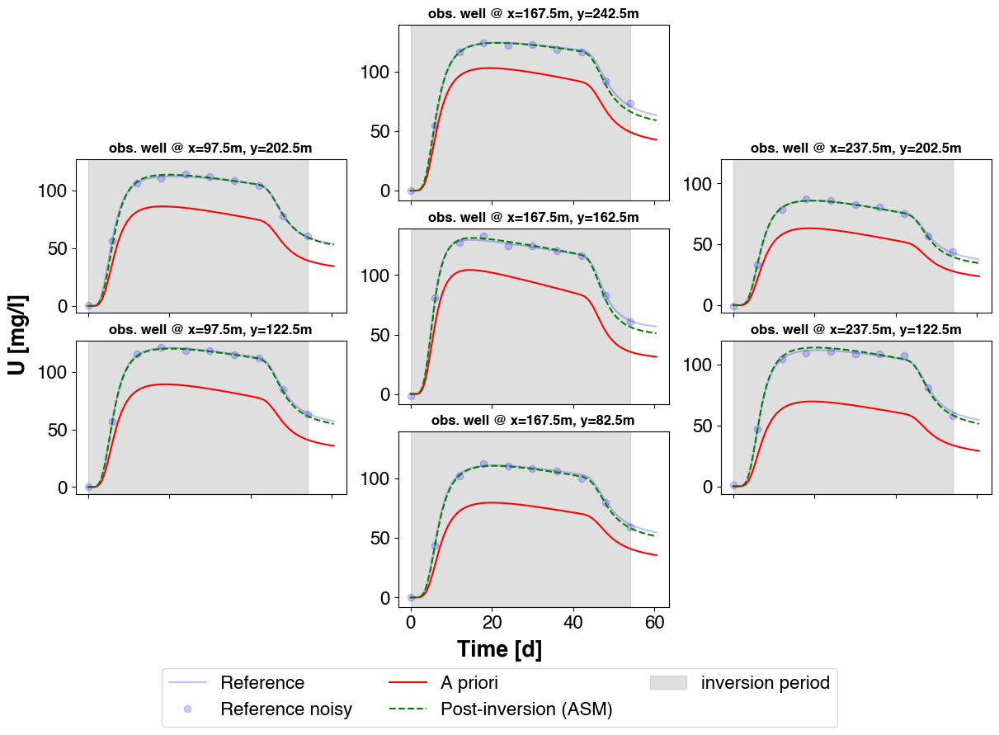

In [71]:
if is_run_asm:
    plot_inv_res_conc_at_producers(
        ref_model=model_reference,
        prior_model=model_estimate,
        inversed_model=model_adjusted_adjoint_full,
        case_name="ASM",
        sp=0,
    )

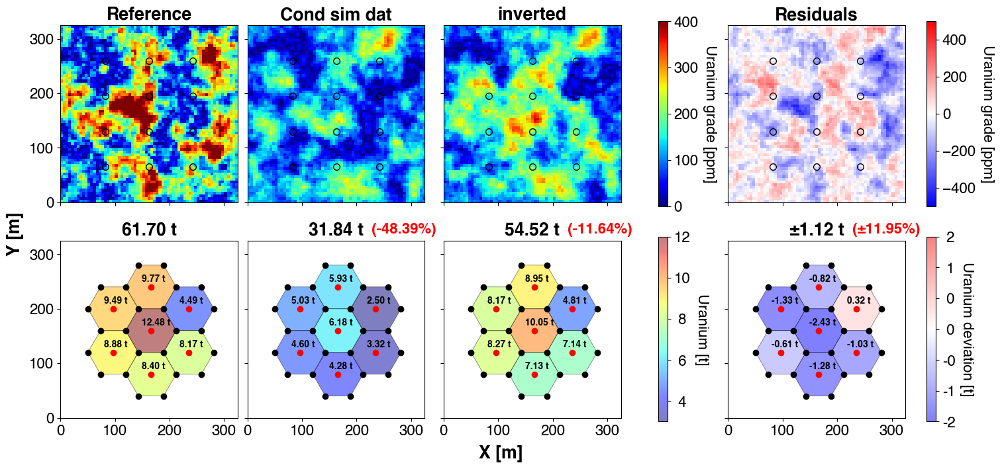

In [72]:
if is_run_asm:
    plot_inv_res_grade_and_reserves(
        ref_grade=reference_grade_ppm,
        prior_grade=estimate_grade_simu_ppm,
        inversed_grade=grade_mol_per_kg_to_ppm(
            model_adjusted_adjoint.tr_model.grade[:, :, 0]
        ),
        case_name="adjoint",
    )

In [ ]:
if is_run_asm:
    plotter = ngp.AnimatedPlotter(
        fig_params={"figsize": (14.0, 8.0)}, subfigs_params={"nrows": 2, "ncols": 3}
    )

    # 1 frame per solver iteration
    nb_frames: int = inverse_model_adjoint.nb_f_calls

    aligned_adjoint_gradients = get_gridded_archived_gradients(
        adjusted_param_adjoint, is_adjoint=True
    )

    gain = np.max(np.abs(aligned_adjoint_gradients))

    # 1) Gradient evolution
    plotter.animated_multi_imshow(
        ax_names=["ax1-1"],
        data={
            "Gradient": aligned_adjoint_gradients,
        },
        # cbar_title="Adjoit head",
        nb_frames=nb_frames,
        imshow_kwargs={
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "aspect": "equal",
            "norm": SymLogNorm(linthresh=0.5),
        },
        # cbar_kwargs={},
        xlabel="X [m]",
        ylabel="Y [m]",
        is_symmetric_cbar=True,
    )
    plotter.get_axis("ax1-1").set_title("Gradient", fontweight="bold")

    if language == Lg.ENGLISH:
        labels = [
            "Uranium grade",
            "Residuals",
            "Cost function",
        ]
    else:
        labels = [
            "Teneurs en uranium",
            "Résidus",
            "Fonction de perte",
        ]

    # 2) Parameter evolution
    plotter.animated_multi_imshow(
        ax_names=["ax1-2"],
        data={
            labels[0]: grade_mol_per_kg_to_ppm(
                np.transpose(
                    np.array(adjusted_param_adjoint.archived_values), axes=[1, 2, 0]
                )
            ),
        },
        nb_frames=nb_frames,
        imshow_kwargs={
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "aspect": "equal",
            # "norm": LogNorm(vmin=1e-5, vmax=1e-3),
            "cmap": plt.get_cmap("jet"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": 0,
            "vmax": 400,
        },
        xlabel="X [m]",
        ylabel="Y [m]",
    )

    plotter.get_axis("ax1-2").set_title(f"{labels[0]} [ppm]", fontweight="bold")

    # 3) Residuals evolution
    plotter.animated_multi_imshow(
        ax_names=["ax1-3"],
        data={
            labels[1]: np.transpose(
                np.array(
                    [
                        grade_mol_per_kg_to_ppm(val) - reference_grade_ppm
                        for val in adjusted_param_adjoint.archived_values
                    ]
                ),
                axes=[1, 2, 0],
            ),
        },
        nb_frames=nb_frames,
        imshow_kwargs={
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "aspect": "equal",
            # "norm": LogNorm(vmin=1e-5, vmax=1e-3),
            "cmap": plt.get_cmap("bwr"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": -300,
            "vmax": 300,
        },
        xlabel="X [m]",
        ylabel="Y [m]",
    )
    plotter.get_axis("ax1-3").set_title(f"{labels[1]} [ppm]", fontweight="bold")

    # 4) Objective function
    vals = inverse_model_adjoint.loss_scaled_history
    obj_fun_vals = np.full((len(vals), nb_frames), fill_value=np.nan)
    for i in range(len(vals)):
        obj_fun_vals[: i + 1, i] = vals[: i + 1]

    plotter.animated_multi_plot(
        ax_name="ax2-1",
        data={
            labels[2]: {"y": obj_fun_vals, "kwargs": {"c": "r", "linestyle": "--"}},
        },
        nb_frames=nb_frames,
        title=labels[1],
        xlabel="Iteration #",
    )
    plotter.ax_dict["ax2-1"].set_yscale("log")

    # 5 & 6) Observation vs predicted values
    conc_observables = [
        obs
        for obs in observables
        if obs.state_variable == dminv.StateVariable.CONCENTRATION
    ]

    # With this approach, no need for grid data conditioning
    # But we keep the observations because we want to vizualize the
    # Add well data -> With the uncertainty
    # Note: we need one observable per location
    grade_observables = [
        obs
        for obs in observables
        if obs.state_variable != dminv.StateVariable.CONCENTRATION
    ]

    if len(grade_observables) == 0:
        for idx, nn in enumerate(dat_nn):
            grade_observables.append(
                dminv.Observable(
                    state_variable=dminv.StateVariable.GRADE,
                    node_indices=nn,
                    times=np.zeros((1)),
                    values=grade_ppm_to_mol_per_kg(dat_val_wrong[idx]),
                    uncertainties=grade_ppm_to_mol_per_kg(np.sqrt(dat_var_init[idx])),
                    sp=0,
                )
            )

    conc_obs_init = dminv.get_observables_values_as_1d_vector(conc_observables)
    grade_obs_init = dminv.get_observables_values_as_1d_vector(grade_observables)
    conc_pred_init = dminv.get_predictions_matching_observations(
        model_estimate, conc_observables
    )
    conc_pred = np.array(executor_adjoint.inv_model.list_d_pred).T[
        : conc_pred_init.size, :
    ]
    grade_pred = np.array(
        [
            np.array(
                [val.ravel("F")[obs.node_indices] for obs in grade_observables]
            ).ravel("F")
            for val in adjusted_param_adjoint.archived_values
        ]
    ).T
    grade_pred_init = grade_pred[:, 0]

    # 5) Concentrations
    pyrtid.plot.plot_observed_vs_simulated(
        plotter.ax_dict["ax2-2"],
        obs_vector=conc_molpl_to_mgpl(conc_obs_init),
        pred_vector_initial=conc_molpl_to_mgpl(conc_pred_init),
        units="mg/l",
    )
    plotter.animated_multi_plot(
        ax_name="ax2-2",
        data={
            "current": {
                "x": conc_molpl_to_mgpl(conc_obs_init),
                "y": conc_molpl_to_mgpl(conc_pred),
                "kwargs": {"c": "b", "linestyle": "none", "marker": ".", "zorder": 2},
            },
        },
        nb_frames=nb_frames,
    )
    # Add a legend
    plotter.get_axis("ax2-2").legend(loc="upper left")

    # 6) Grades
    pyrtid.plot.plot_observed_vs_simulated(
        plotter.ax_dict["ax2-3"],
        obs_vector=grade_mol_per_kg_to_ppm(grade_obs_init),
        pred_vector_initial=grade_mol_per_kg_to_ppm(grade_pred_init),
        units="ppm",
    )
    plotter.animated_multi_plot(
        ax_name="ax2-3",
        data={
            "current": {
                "x": grade_mol_per_kg_to_ppm(grade_obs_init),
                "y": grade_mol_per_kg_to_ppm(grade_pred),
                "kwargs": {"c": "b", "linestyle": "none", "marker": ".", "zorder": 2},
            },
        },
        nb_frames=nb_frames,
    )
    # Add a legend
    plotter.get_axis("ax2-2").legend(loc="upper left")

    plotter.close()
    plotter.animate(nb_frames=nb_frames)
    # Save the animation locally on the computer
    fname_html = fig_save_path.joinpath("inversion_animation_adjoint.html")
    writer = HTMLWriter(fps=2, embed_frames=True)
    writer.frame_format = "svg"  # Ensure svg format
    plotter.animation.save(str(fname_html), writer=writer)

    # Extract the svg from the html file (for animation in Latex)
    ngp.extract_frames_from_embedded_html_animation(fname_html)

    # Display the animation
    HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>
